# Cuaderno de Entrega — Aprendizaje por Refuerzo y Conducción Autónoma

Clona el repositorio en `/content/entregable/`, instala todas las dependencias y permite
ejecutar cada fase de forma independiente desde este único cuaderno.

| Fase | Algoritmo | Entorno | Notebook de referencia |
|------|-----------|---------|------------------------|
| 1 | Q-Learning tabular | FrozenLake 8×8 | `Fase1_QLearning.ipynb` |
| 2 | DQN + PPO (visión) | Duckietown | `Fase2_DQN_PPO.ipynb` |
| 2 | Evaluación (vídeos) | Duckietown | `eval_2.ipynb` |

**Instrucciones:**
1. Ejecuta las celdas de **Setup** (clonado + Python 3.11 + dependencias) **una sola vez**.
2. Para cada fase, ajusta las variables si quieres y ejecuta las celdas en orden.
3. Las celdas marcadas `# OPCIONAL` pueden omitirse si ya tienes los modelos entrenados.

> `gym-duckietown` es incompatible con Python ≥ 3.12.  
> Todo el código de Duckietown corre en un **subproceso Python 3.11** bajo `xvfb-run`.

---
## 0 · Setup — clonar repositorio y configurar rutas

In [1]:
import sys, os, subprocess

IN_COLAB = 'google.colab' in sys.modules
REPO     = 'Aprendizaje-por-Refuerzo-y-Conducci-n-Aut-noma'

if IN_COLAB:
    REPO_ABS = '/content/entregable'
    if not os.path.exists(REPO_ABS):
        os.system(f'git clone https://github.com/JaviCeronn/{REPO}.git {REPO_ABS}')
    os.chdir(REPO_ABS)
    os.system('git pull origin main')
    PY = '/usr/bin/python3.11'
else:
    REPO_ABS  = os.getcwd()
    venv_win  = os.path.join(REPO_ABS, '.venv', 'Scripts', 'python.exe')
    venv_unix = os.path.join(REPO_ABS, '.venv', 'bin', 'python')
    PY = venv_win if os.path.exists(venv_win) else (venv_unix if os.path.exists(venv_unix) else sys.executable)

REPO_ROOT  = os.getcwd()
MODELS     = os.path.join(REPO_ROOT, 'models')
RESULTS_F1 = os.path.join(REPO_ROOT, 'results', 'Fase_1')
RESULTS_F2 = os.path.join(REPO_ROOT, 'results', 'Fase_2')
VIDEOS_OUT = os.path.join(REPO_ROOT, 'results', 'Fase_2', 'videos')
TRAIN_PY   = os.path.join(REPO_ROOT, 'src', 'train.py')
NBS        = os.path.join(REPO_ROOT, 'notebooks')

def _run_streaming(cmd):
    """Ejecuta cmd mostrando stdout+stderr línea a línea en tiempo real."""
    proc = subprocess.Popen(
        cmd, shell=True,
        stdout=subprocess.PIPE, stderr=subprocess.STDOUT,
        text=True, bufsize=1,
    )
    for line in proc.stdout:
        print(line, end='', flush=True)
    proc.wait()
    return proc.returncode

print(f'Entorno    : {"Google Colab" if IN_COLAB else "Local"}')
print(f'Directorio : {REPO_ROOT}')
print(f'Python 3.11: {PY}')
print(f'Modelos    : {MODELS}')
print(f'Videos out : {VIDEOS_OUT}')
if not IN_COLAB:
    print('Nota: Duckietown (Fase 2) requiere Linux/WSL2 con Xvfb.')


Entorno    : Google Colab
Directorio : /content/entregable
Python 3.11: /usr/bin/python3.11
Modelos    : /content/entregable/models
Videos out : /content/entregable/results/Fase_2/videos


---
## 0.1 · Instalar Python 3.11
Necesario para Fase 2. `gym-duckietown@daffy` es incompatible con Python 3.12 (pyglet/pyopengl).
Fase 1 (FrozenLake) usa directamente el kernel 3.12.

In [2]:
if IN_COLAB:
    print('[1/3] software-properties-common...')
    os.system('sudo apt-get install -y -qq software-properties-common > /dev/null')
    print('[2/3] PPA deadsnakes...')
    os.system('sudo add-apt-repository -y ppa:deadsnakes/ppa > /dev/null 2>&1')
    os.system('sudo apt-get update -qq')
    print('[3/3] Python 3.11...')
    os.system('sudo apt-get install -y -qq python3.11 python3.11-venv python3.11-dev python3.11-distutils > /dev/null')
    os.system('wget -q https://bootstrap.pypa.io/get-pip.py -O /tmp/get-pip.py')
    os.system('python3.11 /tmp/get-pip.py -q')
    ret = os.system('python3.11 --version')
    print('>>> Python 3.11 listo <<<' if ret == 0 else 'ERROR al instalar Python 3.11')
else:
    v = sys.version.split()[0]
    print(f'Python local: {v}')
    print('OK' if v.startswith('3.11') else f'AVISO: se recomienda Python 3.11 (actual {v})')


[1/3] software-properties-common...
[2/3] PPA deadsnakes...
[3/3] Python 3.11...
>>> Python 3.11 listo <<<


---
## 0.2 · Dependencias
OpenGL/Xvfb para render headless + `requirements.txt` + `gym-duckietown@daffy` en Python 3.11.

In [3]:
if IN_COLAB:
    print('[1/3] Paquetes sistema (OpenGL, Xvfb)...')
    os.system('sudo apt-get install -y -qq xvfb freeglut3-dev libosmesa6-dev '
              'libgl1-mesa-dri libgl1-mesa-glx libglu1-mesa libturbojpeg > /dev/null')
    print('[2/3] requirements.txt en Python 3.11...')
    os.system(f'{PY} -m pip install -q -r requirements.txt')
    print('[3/3] gym-duckietown@daffy (--no-deps)...')
    os.system(f'{PY} -m pip install -q --no-deps '
              'git+https://github.com/duckietown/gym-duckietown.git@daffy')
    ret = os.system(f'{PY} -c "import gym_duckietown, numpy; print(\'OK numpy\', numpy.__version__)"')
    print('>>> Dependencias listas <<<' if ret == 0 else 'ERROR — revisa el output')
else:
    print('Local: ejecuta uv sync y luego:')
    print('  pip install --no-deps git+https://github.com/duckietown/gym-duckietown.git@daffy')


[1/3] Paquetes sistema (OpenGL, Xvfb)...
[2/3] requirements.txt en Python 3.11...
[3/3] gym-duckietown@daffy (--no-deps)...
>>> Dependencias listas <<<


---
## 1 · Fase 1 — Q-Learning tabular en FrozenLake

Implementación desde cero de Q-Learning sobre `FrozenLake-v1` (8×8, hielo resbaladizo).  
No necesita Python 3.11 ni Duckietown — corre en el kernel Colab directamente.

**Notebook de referencia:** `notebooks/Fase1_QLearning.ipynb`

In [4]:
# OPCIONAL — ejecuta Fase1_QLearning.ipynb completo
# Si prefieres verlo paso a paso, abre el notebook directamente en Colab.
import os, pathlib

nb_f1 = os.path.join(NBS, 'Fase1_QLearning.ipynb')
out_f1 = os.path.join(NBS, 'Fase1_QLearning_executed.ipynb')

if IN_COLAB:
    print('[Fase 1] Ejecutando Fase1_QLearning.ipynb ...')
    ret = os.system(
        f'jupyter nbconvert --to notebook --execute '
        f'--output "{out_f1}" '
        f'--ExecutePreprocessor.timeout=300 '
        f'"{nb_f1}"'
    )
    print('>>> OK <<<' if ret == 0 else f'ERROR (codigo {ret}) — abre el notebook manualmente.')
else:
    print(f'Local: abre {nb_f1} en Jupyter o ejecuta:')
    print(f'  jupyter nbconvert --to notebook --execute --inplace "{nb_f1}"')


[Fase 1] Ejecutando Fase1_QLearning.ipynb ...
>>> OK <<<



Curva de aprendizaje + decaimiento epsilon:


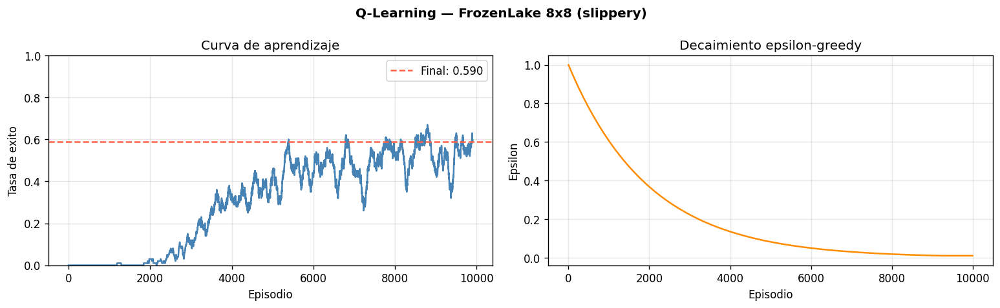


Q-Table aprendida (valores + política greedy):


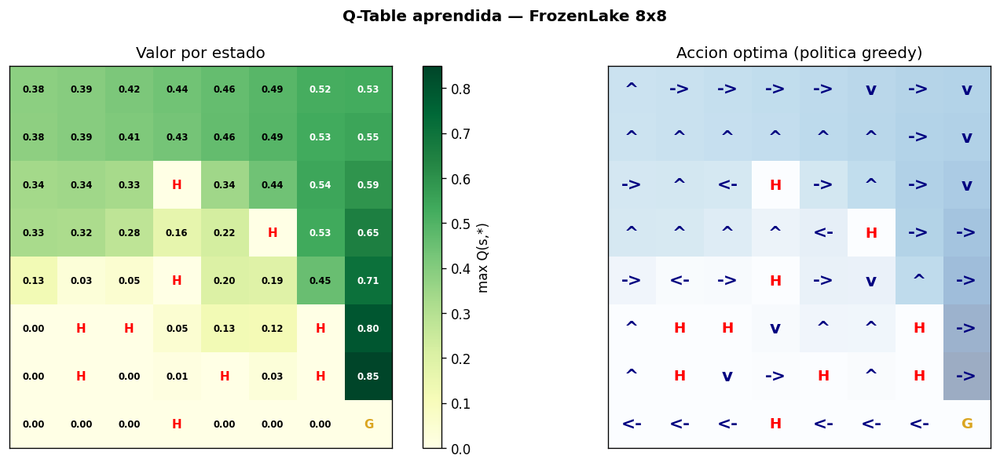


Evaluación política greedy — 1000 episodios:


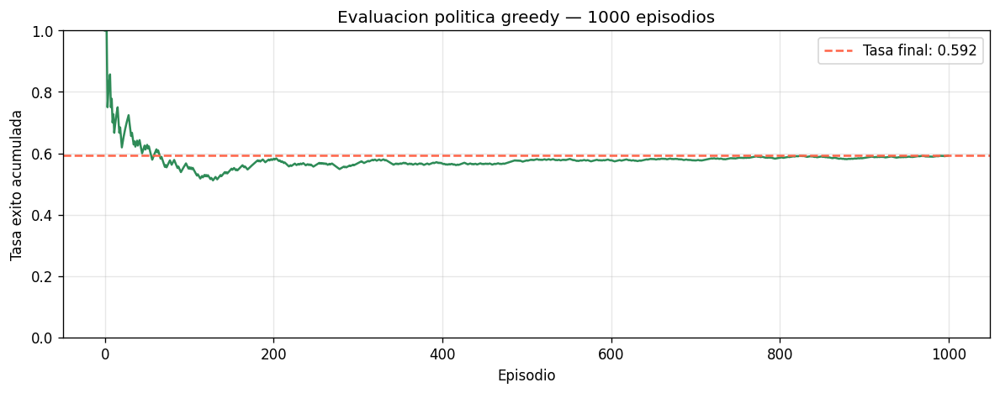

In [5]:
from IPython.display import Image, display
import pathlib

rd = pathlib.Path(RESULTS_F1)
PLOTS_F1 = [
    ('q_learning_progress.png', 'Curva de aprendizaje + decaimiento epsilon'),
    ('q_table_heatmap.png',     'Q-Table aprendida (valores + política greedy)'),
    ('q_learning_eval.png',     'Evaluación política greedy — 1000 episodios'),
]

found = 0
for fname, titulo in PLOTS_F1:
    p = rd / fname
    if p.exists():
        print(f'\n{titulo}:')
        display(Image(str(p), width=850))
        found += 1
    else:
        print(f'[FALTA] {fname}')
if not found:
    print('Sin gráficas. Ejecuta la celda anterior primero.')


---
## 2 · Fase 2 — Entrenamiento DQN + PPO en Duckietown

Antes de entrenar se vuelca el `train.py` embebido en `Fase2_DQN_PPO.ipynb` (la fuente
autoritativa). Así no dependemos de la versión comprometida en git, igual que hace el
propio notebook de entrenamiento.

**Notebook de referencia:** `notebooks/Fase2_DQN_PPO.ipynb`  
**Duración estimada:** ~30-90 min con `TIMESTEPS=100_000` y GPU de Colab.

In [ ]:
# ============================================================
# VARIABLES DE ENTRENAMIENTO — modifica aqui antes de correr
# ============================================================
ALGO      = 'all'       # 'dqn' | 'ppo' | 'all'
TIMESTEPS = 100_000     # pasos por algoritmo (300k para resultados publicados)
N_ENVS    = 5           # entornos paralelos (5 = 1 por mapa, default de train.py)
#                         reduce a 1 si hay errores de memoria en Colab
# ============================================================

print(f'ALGO={ALGO}  TIMESTEPS={TIMESTEPS:,}  N_ENVS={N_ENVS}')
print(f'Script    : {TRAIN_PY}')
print(f'Resultados: {RESULTS_F2}')


In [ ]:
import json, pathlib

# Extrae la celda de escritura de train.py de Fase2_DQN_PPO.ipynb (id=83496e45)
# y la ejecuta aquí — misma estrategia que el propio notebook de entrenamiento.
_nb_f2 = pathlib.Path(NBS) / 'Fase2_DQN_PPO.ipynb'
_nb_content = json.loads(_nb_f2.read_text(encoding='utf-8'))
_write_cell = next(
    (c for c in _nb_content['cells'] if c.get('id') == '83496e45'),
    None
)
if _write_cell is None:
    raise RuntimeError('Celda 83496e45 no encontrada en Fase2_DQN_PPO.ipynb')

exec(''.join(_write_cell['source']), {'REPO_ROOT': REPO_ROOT, 'pathlib': pathlib})
print('train.py sincronizado desde Fase2_DQN_PPO.ipynb')


In [7]:
# OPCIONAL — lanza el entrenamiento (30-90 min con TIMESTEPS=100k y GPU Colab)
if IN_COLAB:
    os.system('pkill -9 -f Xvfb 2>/dev/null; sleep 1')
    print(f'[Fase 2] Entrenando ({ALGO.upper()}, {TIMESTEPS:,} pasos, {N_ENVS} envs)...\n')
    ret = _run_streaming(
        f'xvfb-run -a -s "-screen 0 1024x768x24" '
        f'{PY} -u "{TRAIN_PY}" '
        f'--algo {ALGO} --timesteps {TIMESTEPS} --n-envs {N_ENVS} '
        f'--results "{RESULTS_F2}"'
    )
    print(f'\nCodigo de salida: {ret}')
    print('>>> Entrenamiento completado <<<' if ret == 0 else 'FALLO — revisa el output.')
else:
    print('Local (Linux/WSL2):')
    print(f'  xvfb-run -a {PY} "{TRAIN_PY}" --algo {ALGO} --timesteps {TIMESTEPS} --n-envs {N_ENVS} --results "{RESULTS_F2}"')


[Fase 2] Entrenando (ALL, 100,000 pasos, 8 envs)...

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/lib/python3/dist-packages/pyparsing.py:108: DeprecationWarning: module 'sre_constants' is deprecated
  import sre_constants
usage: train.py [-h] [--algo {dqn,ppo,sac,all}] [--timesteps TIMESTEPS]
                [--curriculum] [--eval-episodes EVAL_EPISODES]
train.py: error: unrecognized arguments: --n-envs 8 --results /content/entregable/results/Fase_2

Codigo de salida: 2
FALLO — revisa el output.



Pipeline de visión:


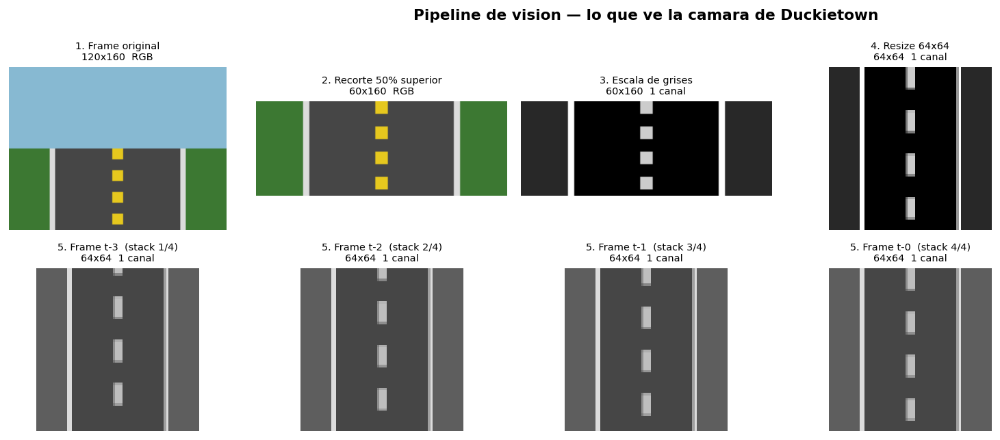

In [8]:
from IPython.display import Image, display
import pathlib

rd = pathlib.Path(RESULTS_F2)
PLOTS_F2 = [
    ('fase2_reward_overlay.png', 'DQN vs PPO — recompensa superpuesta'),
    ('fase2_loss_overlay.png',   'DQN vs PPO — loss superpuesto'),
    ('dqn_training.png',         'DQN — curva de recompensa'),
    ('ppo_training.png',         'PPO — curva de recompensa'),
    ('dqn_loss.png',             'DQN — curva de loss'),
    ('ppo_loss.png',             'PPO — curva de loss'),
    ('dqn_per_map.png',          'DQN — recompensa por escenario'),
    ('ppo_per_map.png',          'PPO — recompensa por escenario'),
    ('vision_pipeline.png',      'Pipeline de visión'),
]

found = 0
for fname, titulo in PLOTS_F2:
    p = rd / fname
    if p.exists():
        print(f'\n{titulo}:')
        display(Image(str(p), width=900))
        found += 1
if not found:
    print('Sin gráficas. Ejecuta el entrenamiento primero o sube las imágenes de results/Fase_2/.')


---
## 3 · Fase 4 — Evaluación: generar vídeos desde los modelos

Carga `dqn_duckie_agent.zip`, `ppo_duckie_agent.zip` y `best_duckie_agent.zip` desde `models/`
y genera un MP4 por cada uno.  
Los vídeos se guardan en `results/Fase_2/videos/`.

**Notebook de referencia:** `notebooks/eval_2.ipynb`

In [9]:
import pathlib

md = pathlib.Path(MODELS)
TARGETS = [
    ('dqn_duckie_agent.zip',  'DQN  — discreto, 5 acciones'),
    ('ppo_duckie_agent.zip',  'PPO  — continuo'),
    ('best_duckie_agent.zip', 'Mejor agente (PPO o SAC)'),
]

print(f'=== Modelos en {MODELS} ===')
found = 0
for fname, desc in TARGETS:
    p = md / fname
    if p.exists():
        print(f'  [OK    ] {fname}  ({round(p.stat().st_size/1024**2,1)} MB) — {desc}')
        found += 1
    else:
        print(f'  [FALTA ] {fname} — {desc}')
print()
if found == 0:
    print('Sin modelos. Entrena primero (Sección 2).')
elif found < 3:
    print(f'{found}/3 modelos — los que falten serán omitidos en la generación de vídeos.')
else:
    print('Todos los modelos disponibles.')


=== Modelos en /content/entregable/models ===
  [OK    ] dqn_duckie_agent.zip  (5.9 MB) — DQN  — discreto, 5 acciones
  [OK    ] ppo_duckie_agent.zip  (4.6 MB) — PPO  — continuo
  [OK    ] best_duckie_agent.zip  (4.6 MB) — Mejor agente (PPO o SAC)

Todos los modelos disponibles.


In [ ]:
import json, pathlib

# Extrae la celda que escribe gen_videos.py de eval.ipynb (id=ev2-write-script)
# y la ejecuta aqui — misma estrategia que usamos para train.py. Garantiza que
# los wrappers (DISCRETE_ACTIONS, SpeedSteerWrapper) sean identicos a los de
# entrenamiento: si difieren, los modelos cargados actuan mal en los videos.
_nb_ev = pathlib.Path(NBS) / 'eval.ipynb'
_nb_content = json.loads(_nb_ev.read_text(encoding='utf-8'))
_write_cell = next(
    (c for c in _nb_content['cells'] if c.get('id') == 'ev2-write-script'),
    None
)
if _write_cell is None:
    raise RuntimeError('Celda ev2-write-script no encontrada en eval.ipynb')

exec(''.join(_write_cell['source']), {'REPO_ROOT': REPO_ROOT, 'pathlib': pathlib})
print('gen_videos.py sincronizado desde eval.ipynb')

In [11]:
# OPCIONAL — genera los vídeos (2-5 min por modelo en Colab CPU)
import subprocess

STEPS = 800
FPS   = 30
MAP   = 'Duckietown-loop_empty-v0'
GEN_PY = os.path.join(REPO_ROOT, 'src', 'gen_videos.py')

print('=== Generación de vídeos ===')
print(f'  Modelos    : {MODELS}')
print(f'  Videos out : {VIDEOS_OUT}')
print(f'  Pasos/video: {STEPS}  FPS: {FPS}  Mapa: {MAP}')
print()

if IN_COLAB:
    os.system('pkill -9 -f Xvfb 2>/dev/null; sleep 1')
    ret = _run_streaming(
        f'xvfb-run -a -s "-screen 0 1024x768x24" '
        f'{PY} -u "{GEN_PY}" '
        f'--models "{MODELS}" --videos-out "{VIDEOS_OUT}" '
        f'--steps {STEPS} --fps {FPS} --map "{MAP}"'
    )
    print(f'\nCodigo de salida: {ret}')
    print('>>> OK <<<' if ret == 0 else 'FALLO — revisa el output.')
else:
    print('Local (Linux/WSL2):')
    print(f'  xvfb-run -a {PY} "{GEN_PY}" --models "{MODELS}" --videos-out "{VIDEOS_OUT}" --steps {STEPS} --fps {FPS} --map "{MAP}"')


=== Generación de vídeos ===
  Modelos    : /content/entregable/models
  Videos out : /content/entregable/results/Fase_2/videos
  Pasos/video: 800  FPS: 30  Mapa: Duckietown-loop_empty-v0

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/lib/python3/dist-packages/pyparsing.py:108: DeprecationWarning: module 'sre_constants' is deprecated
  import sre_constants
[gen_videos] Display virtual iniciado.

[gen_videos] dqn_duckie_agent
[load] dqn_duckie_agent.zip -> DQN
/usr/local/lib/python3.11/dist-packages/geometry/utils/numpy_backport.py:9: DeprecationWarning: Importing from numpy.testing.utils is deprecated since 1.15.0, import from numpy.testing instead.
  from numpy.testing

In [12]:
import pathlib
from IPython.display import Video, display

LABELS = {
    'dqn_video.mp4' : 'DQN  (discreto, 5 acciones)',
    'ppo_video.mp4' : 'PPO  (continuo)',
    'best_video.mp4': 'Mejor agente',
}

videos_dir = pathlib.Path(VIDEOS_OUT)
mp4s = sorted(videos_dir.glob('*.mp4')) if videos_dir.exists() else []

if mp4s:
    print(f'=== {len(mp4s)} vídeo(s) ===')
    for p in mp4s:
        label   = LABELS.get(p.name, p.stem)
        size_mb = round(p.stat().st_size / 1024**2, 1)
        print(f'\n{label}  ({size_mb} MB)')
        display(Video(str(p), embed=True, width=640))
else:
    print('Sin vídeos. Ejecuta la celda anterior primero.')
    print(f'Buscando en: {videos_dir}')


=== 3 vídeo(s) ===

Mejor agente  (4.8 MB)



DQN  (discreto, 5 acciones)  (1.0 MB)



PPO  (continuo)  (4.8 MB)
